In [5]:
import sys
sys.path.append("..")
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from utils.fid import fid_from_stats


In [3]:
def read_random_png_images(folder_path, num_images):
    """
    Reads a specified number of randomly selected PNG images from a folder into a list using matplotlib.

    Args:
        folder_path (str): Path to the folder containing PNG files.
        num_images (int): Number of images to randomly select and read.

    Returns:
        List[numpy.ndarray]: List of image arrays.
    """
    png_files = [f for f in os.listdir(folder_path) if f.lower().endswith('.png')]
    selected_files = random.sample(png_files, min(num_images, len(png_files)))
    images = [plt.imread(os.path.join(folder_path, fname)) for fname in selected_files]
    return images

# Task: Validate the migration of the model from JAX to Torch
The migration from JAX to torch was performed in 2 phases:
1. Migrating only the DiT (shortcut model) implementation to torch with its weights
2. Migrating the VAE itself to torch

The results below compare the generation results of 3 configurations both numericaly (in terms of FID) and visually (selection of 20 random generated images):
1. The full, original JAX implementation
2. The torch implementation of the DiT applied with inputs produced with the original VAW
3. The full torch pipeline

In [9]:
orig_jax_stats = np.load("../results/orig_jax/fid_stats.npz")
torch_DiT_jax_VAE_stats = np.load("../results/torch/orig/fid_stats.npz")
torch_full_stats = np.load("../results/torch/full/fid_stats.npz")
real_dist_stats = np.load("../results/celebahq256_fid_stats.npz")

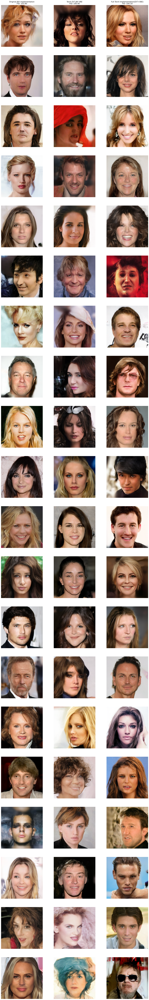

In [12]:
num_images = 20
cases_names = "Original JAX implementation", "Torch DiT JAX VAE", "Full Torch Implementation(DiT+VAE)"
results_folders = ["../results/orig_jax", "../results/torch/orig", "../results/torch/full"]
num_cases = len(results_folders)
fig, ax = plt.subplots(num_images, num_cases, figsize=(num_cases*6, num_images*6))
for j, (case, folder) in enumerate(zip(cases_names, results_folders)):
    images = read_random_png_images(folder, num_images)
    for i, img in enumerate(images):
        ax[i][j].axis("off")
        ax[i][j].imshow(img)
        if i == 0:
            stats = np.load(os.path.join(folder, "fid_stats.npz"))
            fid = fid_from_stats(stats["mu"], stats["sigma"], real_dist_stats["mu"], real_dist_stats["sigma"])
            title = f"{case}\nFID: {fid:.2f}"
            ax[i][j].set_title(title)
        